#  <font color='red'> Perceptron classifier </font> 

Perceptron is a discriminative classifier, which assumes a linear discriminant
$$y(\mathbf x) = \mathbf w^T\mathbf x+w_0$$
 
 This discriminant can also be written as

 $$y(\mathbf x) = \underbrace{\begin{bmatrix}\mathbf w^T,w_0\end{bmatrix}}_{\mathbf a^T}\underbrace{\begin{bmatrix}\mathbf x,1\end{bmatrix}}_{\widetilde{\mathbf x}} $$


In [2]:
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib.animation as ani


import numpy as np
import pandas as pd

plt.rcParams.update({'font.size': 16})
plt.rcParams['figure.figsize'] = [12, 6]


In [3]:
fname = 'fishes.csv'
data = pd.read_csv(fname)
data.head(10)

# Exctracting the fields with Fishtype=1 (bass)
bass = data[data["Fishtype"] == 1]
basslightness = bass['lightness'].to_numpy()
basslength = bass['length'].to_numpy()
basscount = np.shape(basslength)[0]
print(basscount)

# Exctracting the fields with Fishtype=0 (salmon)
salmon = data[data["Fishtype"] == 0]
salmonlightness = salmon['lightness'].to_numpy()
salmonlength = salmon['length'].to_numpy()

salmoncount = np.shape(salmonlightness)[0]
print(salmoncount)

32304
18203


We require 
 $$\mathbf a^T \widetilde{\mathbf x_i} > 0; ~~~~\forall \widetilde{\mathbf x_i} \in \mathcal C_1$$ and $$\mathbf a^T \widetilde{\mathbf x_i} < 0; ~~~~\forall\widetilde{\mathbf x_i} \in \mathcal C_2$$.

By multiplying the extended features with labels $y_i$ that are +1 for $\mathcal C_1$ and -1 for $\mathcal C_2$, we obtain

$$\mathbf a^T \underbrace{\widetilde{\mathbf x_i}y_i}_{\mathbf z_i} > 0$$
These relations can be concatenated into a matrix inequality

 $$\mathbf l = \mathbf a^T \mathbf Z > 0$$ 

The points that violate the above inequality are wrongly classified.

In [4]:
x1 = np.asmatrix(np.stack((salmonlightness,salmonlength),axis=1))
x2 = np.asmatrix(np.stack((basslightness,basslength),axis=1))

x1ones = np.asmatrix(np.ones((salmoncount,1)))
x1tilde = np.concatenate((x1,x1ones),axis=1)

x2ones = np.asmatrix(np.ones((basscount,1)))
x2tilde = np.concatenate((x2,x2ones),axis=1)

Z = np.concatenate((x1tilde,-x2tilde),axis=0)
Z = Z.T

a = np.asmatrix(np.random.randn(3,1))

labels = np.squeeze(np.matmul(np.transpose(a),Z))
wrongindices = np.argwhere(labels<0)[:,1]
nwrong = np.sum(labels<0)
print('Number of wrongly classified points=',nwrong)


Number of wrongly classified points= 32304


Visualize the separating line $y(\mathbf x)=\mathbf w^T \mathbf x+ w_0 = 0$

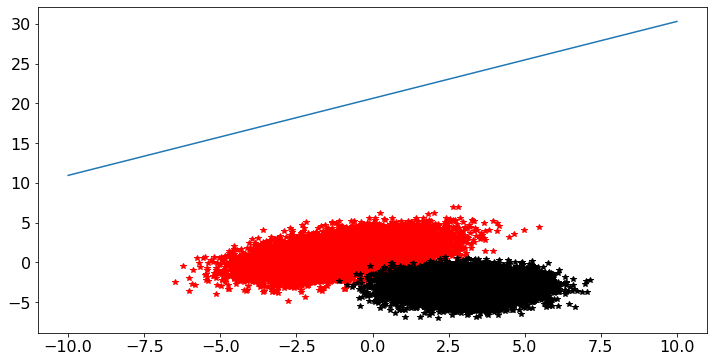

In [5]:
x = np.linspace(-10,10,100)
x = np.asmatrix(x)
y = -(a[0]*x+a[2])/a[1]
s = plt.plot(x.T,y.T)
s = plt.plot(salmonlightness,salmonlength,'r*')
s = plt.plot(basslightness,basslength,'k*')

 Perceptron uses the cost function
        $$\mathcal J = -\sum_{n\in \mathcal Y} \mathbf a^T \mathbf z_n$$
where $\mathcal Y$ is the set of misclassified points. The gradient of the cost function is 
$$\nabla_{\mathbf a} J(\mathbf a) = -\sum_{n\in \mathcal Y}\mathbf z_n$$

 Perceptron algorithm uses steepest descent 
 $$\mathbf a_{i+1} = \mathbf a_{i} - \eta ~\nabla_{\mathbf a} J(\mathbf a_i)$$
 to obtain the minimum.

In [6]:
eta = 1e-2
for i in range(500):
    labels = np.squeeze(np.matmul(np.transpose(a),Z))
    wrongindices = np.argwhere(labels<0)[:,1]
    Gradient = -np.sum(Z[:,wrongindices],axis=1)
    a = a - eta*Gradient
    nwrong = np.sum(labels<0)
    if(np.squeeze(np.mod(i,30))==0):
        print('Number of wrongly classified points at iteration ',i,'is',nwrong)


labels = np.squeeze(np.matmul(np.transpose(a),Z))
wrongindices = np.argwhere(labels<0)[:,1]
nwrong = np.sum(labels<0)
print('Number of final number of misclassified points=',nwrong)



Number of wrongly classified points at iteration  0 is 32304
Number of wrongly classified points at iteration  30 is 1130
Number of wrongly classified points at iteration  60 is 647
Number of wrongly classified points at iteration  90 is 367
Number of wrongly classified points at iteration  120 is 236
Number of wrongly classified points at iteration  150 is 176
Number of wrongly classified points at iteration  180 is 137
Number of wrongly classified points at iteration  210 is 117
Number of wrongly classified points at iteration  240 is 111
Number of wrongly classified points at iteration  270 is 119
Number of wrongly classified points at iteration  300 is 123
Number of wrongly classified points at iteration  330 is 123
Number of wrongly classified points at iteration  360 is 123
Number of wrongly classified points at iteration  390 is 123
Number of wrongly classified points at iteration  420 is 124
Number of wrongly classified points at iteration  450 is 125
Number of wrongly classifi

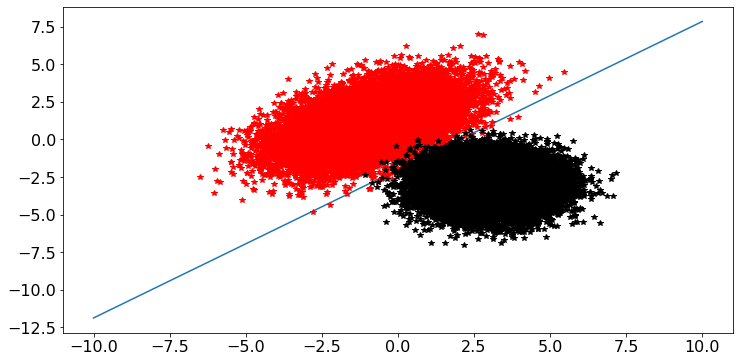

In [7]:
x = np.linspace(-10,10,100)
x = np.asmatrix(x)
y = -(a[0]*x+a[2])/a[1]
s = plt.plot(x.T,y.T)
s = plt.plot(salmonlightness,salmonlength,'r*')
s = plt.plot(basslightness,basslength,'k*')
